<p align="center">
    <strong style="font-size: 25px;">An Anime Generator project with "GAN" using "PyTorch"</strong>
</p>

<br>

<p align="center">
    <span style="font-size: 16.5px; font-weight: normal;">Mohammad Soroush Esnaashari</span>
</p>

<p align="center">
  <a href="https://soroushesnaashari.github.io" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="Website"
         src="https://img.shields.io/badge/-Website-2d2d2d?style=flat-square&logo=githubpages&logoColor=white"
         style="vertical-align:middle;">
  </a>
  <a href="https://www.linkedin.com/in/soroushesnaashari" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="LinkedIn"
         src="https://custom-icon-badges.demolab.com/badge/-LinkedIn-2d2d2d?style=flat-square&logo=linkedin-white&logoColor=white"
         style="vertical-align:middle;">
  </a>
  <a href="https://x.com/srshesn" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="X"
         src="https://img.shields.io/badge/-Twitter-2d2d2d?style=flat-square&logo=X&logoColor=white"
         style="vertical-align:middle;">
  </a>
  <a href="https://github.com/soroushesnaashari" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="GitHub"
         src="https://img.shields.io/badge/-GitHub-2d2d2d?style=flat-square&logo=github&logoColor=white"
         style="vertical-align:middle;">
  </a>
  <a href="https://www.kaggle.com/soroushesnaashari" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="Kaggle"
         src="https://img.shields.io/badge/-Kaggle-2d2d2d?style=flat-square&logo=kaggle&logoColor=white"
         style="vertical-align:middle;">
  </a>
</p>

## <span style="color: #c77dff">1 | </span><span style="color: #7b2cbf">Libraries</span>

In [1]:
import os
import time
import glob
import random

import torch, sys
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid, save_image

import matplotlib.pyplot as plt
from PIL import Image

## <span style="color: #c77dff">2 | </span><span style="color: #7b2cbf">PreProcessing</span>

### <span style="color: #e0aaff">2.1 | </span><span style="color: #9d4edd">Constants</span>

In [2]:
DATA_DIR   = "/kaggle/input/animefacedataset/images"
IMAGE_SIZE = 64
BATCH_SIZE = 256
NUM_WORKERS= 4

**`Not bad to know :`**<br>
This part of the code is for learning the hardware that your PC gonna use. I know that while I'm using MacOS with intel chip I am not able to use the first two options which are more advanced and appropriate options to use in Deep Learning. But if you're using a system with Nvidia chips you are able to use the first item which is CUDA and also if you're using Mac with Apple Silicon chip you're also not able to use the first option but you're able to use Apple MPS. And if you're like me which your system didn't support neither of the previous options, you can use your PC's CPU which is not recommended or you can use some platforms such as Kaggle or Google Colab where they let you use a non-local accelerator with limitation which is recommended.
Due to the fact that I'm using GPU T4 accelerator from Kaggle to output of the next code would be: Using CUDA GPU

In [3]:
# NVIDIA CUDA?
if torch.cuda.is_available():
    DEVICE = torch.device("cuda")
    print(f"=> Using CUDA GPU: {torch.cuda.get_device_name(0)}")

# Apple MPS (Metal) for Apple Silicon
elif getattr(torch.backends, "mps", None) and torch.backends.mps.is_available():
    DEVICE = torch.device("mps")
    print("=> Using Apple Silicon GPU (MPS)")

# Fallback to CPU
else:
    DEVICE = torch.device("cpu")
    print("=> WARNING: No GPU detected, using CPU only")

print(f"Device set to: {DEVICE}", file=sys.stderr)

=> Using CUDA GPU: Tesla T4


Device set to: cuda


### <span style="color: #e0aaff">2.2 | </span><span style="color: #9d4edd">Inspect and plot original image sizes</span>

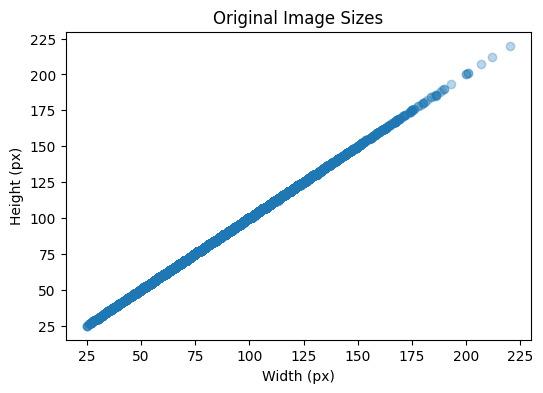

In [4]:
all_paths = glob.glob(os.path.join(DATA_DIR, "*.jpg"))

sizes = []
for p in all_paths:
    im = Image.open(p)
    sizes.append(im.size)

widths, heights = zip(*sizes)
plt.figure(figsize=(6,4))
plt.scatter(widths, heights, alpha=0.3)
plt.title("Original Image Sizes")
plt.xlabel("Width (px)")
plt.ylabel("Height (px)")
plt.show()

### <span style="color: #e0aaff">2.3 | </span><span style="color: #9d4edd">Preprocessing transform pipeline</span>

In [5]:
transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize((0.5,)*3, (0.5,)*3)
])

### <span style="color: #e0aaff">2.4 | </span><span style="color: #9d4edd">Build DataLoader</span>

In [7]:
class AnimeFaceDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.paths = glob.glob(os.path.join(root_dir, '*.jpg'))
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img_path = self.paths[idx]
        img      = Image.open(img_path).convert('RGB')
        if self.transform:
            img = self.transform(img)
        return img

dataset    = AnimeFaceDataset(DATA_DIR, transform=transform)
dataloader = DataLoader(
    dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    drop_last=True
)

print(f"Number of images: {len(dataset)}")
img_batch = next(iter(dataloader))
print("Batch shape:", img_batch.shape)

Number of images: 63565
Batch shape: torch.Size([256, 3, 64, 64])


### <span style="color: #e0aaff">2.5 | </span><span style="color: #9d4edd">Verify resized sizes and plot</span>

Batch shape: torch.Size([256, 3, 64, 64])


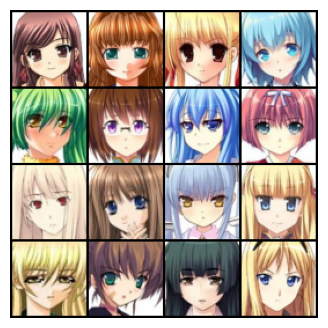

In [9]:
imgs = next(iter(dataloader))
print("Batch shape:", imgs.shape)

# Now plot the first 16 images
grid = make_grid((imgs[:16] + 1) / 2, nrow=4)
plt.figure(figsize=(4,4))
plt.axis("off")
plt.imshow(grid.permute(1,2,0).cpu())
plt.show()

### <span style="color: #e0aaff">2.6 | </span><span style="color: #9d4edd">Display 8 random images with their original & resized sizes</span>

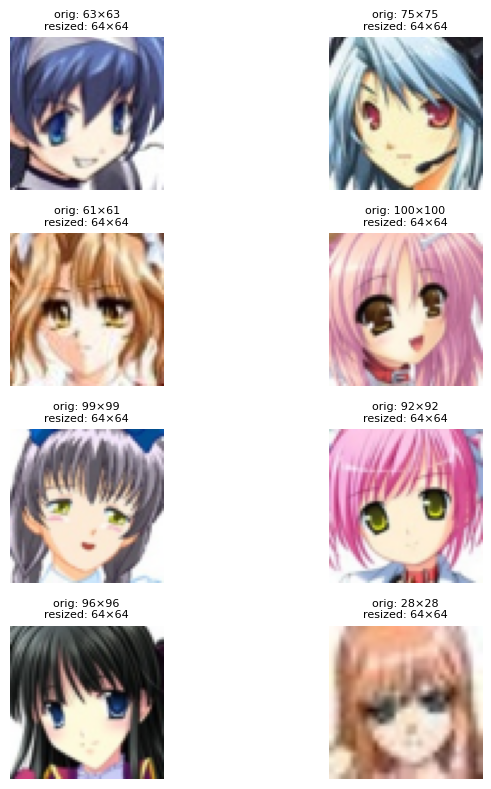

In [10]:
samples = random.sample(all_paths, 8)
plt.figure(figsize=(8,8))
for i, p in enumerate(samples):
    orig = Image.open(p)
    w0,h0 = orig.size
    img = transform(orig)
    img_disp = (img + 1)/2
    plt.subplot(4,2,i+1)
    plt.imshow(img_disp.permute(1,2,0))
    plt.axis("off")
    plt.title(f"orig: {w0}×{h0}\nresized: {IMAGE_SIZE}×{IMAGE_SIZE}", fontsize=8)
plt.tight_layout()
plt.show()

## <span style="color: #c77dff">3 | </span><span style="color: #7b2cbf">Creating a **DCGAN** Model</span>

### <span style="color: #e0aaff">3.1 | </span><span style="color: #9d4edd">Generator</span>

In [14]:
from torchinfo import summary

class Generator(nn.Module):
    def __init__(self, latent_dim=100, ngf=64):
        super().__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8), nn.ReLU(True),
            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*4), nn.ReLU(True),
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2), nn.ReLU(True),
            nn.ConvTranspose2d(ngf*2, ngf,   4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),   nn.ReLU(True),
            nn.ConvTranspose2d(ngf, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, z):
        return self.net(z)

netG = Generator(latent_dim=100, ngf=64).to(DEVICE)
summary(netG, input_size=(1, 100, 1, 1))

Layer (type:depth-idx)                   Output Shape              Param #
Generator                                [1, 3, 64, 64]            --
├─Sequential: 1-1                        [1, 3, 64, 64]            --
│    └─ConvTranspose2d: 2-1              [1, 512, 4, 4]            819,200
│    └─BatchNorm2d: 2-2                  [1, 512, 4, 4]            1,024
│    └─ReLU: 2-3                         [1, 512, 4, 4]            --
│    └─ConvTranspose2d: 2-4              [1, 256, 8, 8]            2,097,152
│    └─BatchNorm2d: 2-5                  [1, 256, 8, 8]            512
│    └─ReLU: 2-6                         [1, 256, 8, 8]            --
│    └─ConvTranspose2d: 2-7              [1, 128, 16, 16]          524,288
│    └─BatchNorm2d: 2-8                  [1, 128, 16, 16]          256
│    └─ReLU: 2-9                         [1, 128, 16, 16]          --
│    └─ConvTranspose2d: 2-10             [1, 64, 32, 32]           131,072
│    └─BatchNorm2d: 2-11                 [1, 64, 32, 32]  

### <span style="color: #e0aaff">3.2 | </span><span style="color: #9d4edd">Discriminator</span>

In [15]:
class Discriminator(nn.Module):
    def __init__(self, ndf=64):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, ndf,    4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, True),
            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*2), nn.LeakyReLU(0.2, True),
            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*4), nn.LeakyReLU(0.2, True),
            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*8), nn.LeakyReLU(0.2, True),
            nn.Conv2d(ndf*8, 1,     4, 1, 0, bias=False),
            nn.Flatten(),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x)

netD = Discriminator(ndf=64).to(DEVICE)
summary(netD, input_size=(1, 3, IMAGE_SIZE, IMAGE_SIZE))

Layer (type:depth-idx)                   Output Shape              Param #
Discriminator                            [1, 1]                    --
├─Sequential: 1-1                        [1, 1]                    --
│    └─Conv2d: 2-1                       [1, 64, 32, 32]           3,072
│    └─LeakyReLU: 2-2                    [1, 64, 32, 32]           --
│    └─Conv2d: 2-3                       [1, 128, 16, 16]          131,072
│    └─BatchNorm2d: 2-4                  [1, 128, 16, 16]          256
│    └─LeakyReLU: 2-5                    [1, 128, 16, 16]          --
│    └─Conv2d: 2-6                       [1, 256, 8, 8]            524,288
│    └─BatchNorm2d: 2-7                  [1, 256, 8, 8]            512
│    └─LeakyReLU: 2-8                    [1, 256, 8, 8]            --
│    └─Conv2d: 2-9                       [1, 512, 4, 4]            2,097,152
│    └─BatchNorm2d: 2-10                 [1, 512, 4, 4]            1,024
│    └─LeakyReLU: 2-11                   [1, 512, 4, 4]     

### <span style="color: #e0aaff">3.3 | </span><span style="color: #9d4edd">Loss Functions & Optimizers</span>

In [16]:
criterion = nn.BCELoss()
lr        = 2e-4
beta1     = 0.5

netG = Generator().to(DEVICE)
netD = Discriminator().to(DEVICE)

optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1,0.999))
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1,0.999))

### <span style="color: #e0aaff">3.4 | </span><span style="color: #9d4edd">Weight Initialization</span>

In [17]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

netG.apply(weights_init)
netD.apply(weights_init)

Discriminator(
  (net): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Flatten(start_dim=1, end_dim=-1)
    (13): Sigm

### <span style="color: #e0aaff">3.5 | </span><span style="color: #9d4edd">Training Utilities</span>

In [18]:
ckpt_dir = './torch_checkpoints'; os.makedirs(ckpt_dir, exist_ok=True)
seed_noise = torch.randn(16, 100, 1,1, device=DEVICE)

### <span style="color: #e0aaff">3.6 | </span><span style="color: #9d4edd">Training Step</span>

In [19]:
def train_step(real):
    b_size = real.size(0)

    real_labels = torch.ones(b_size, device=DEVICE)
    fake_labels = torch.zeros(b_size, device=DEVICE)

    netD.zero_grad()
    output_real = netD(real).view(-1)
    lossD_real  = criterion(output_real, real_labels)
    noise       = torch.randn(b_size,100,1,1, device=DEVICE)
    fake        = netG(noise)
    output_fake = netD(fake.detach()).view(-1)
    lossD_fake  = criterion(output_fake, fake_labels)
    lossD       = lossD_real + lossD_fake
    lossD.backward()
    optimizerD.step()

    netG.zero_grad()
    output = netD(fake).view(-1)
    lossG  = criterion(output, real_labels)
    lossG.backward()
    optimizerG.step()

    return lossG.item(), lossD.item()

### <span style="color: #e0aaff">3.7 | </span><span style="color: #9d4edd">Training Loop & Kick off Training</span>

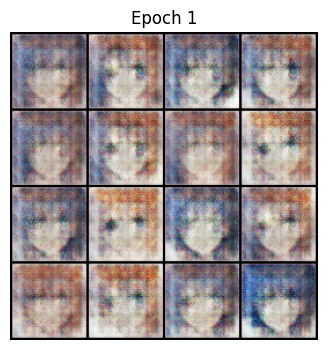

Epoch 01 | G loss: 8.1711 | D loss: 0.8746


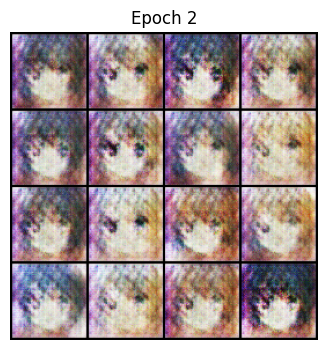

Epoch 02 | G loss: 6.1214 | D loss: 0.7629


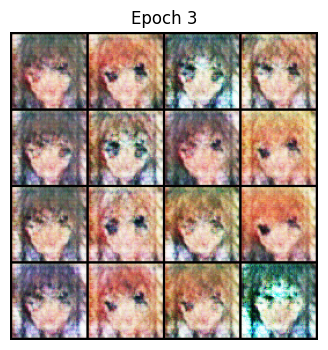

Epoch 03 | G loss: 5.9365 | D loss: 0.6801


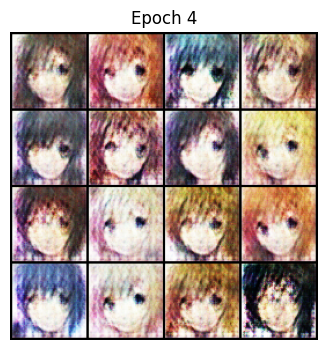

Epoch 04 | G loss: 5.6474 | D loss: 0.6415


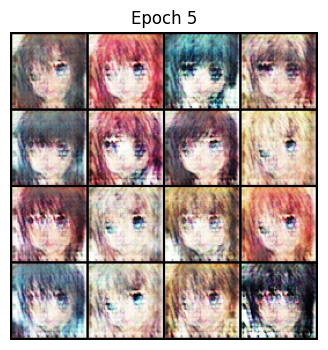

Epoch 05 | G loss: 6.0043 | D loss: 0.6458


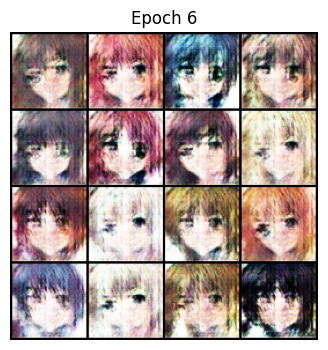

Epoch 06 | G loss: 6.0252 | D loss: 0.5418


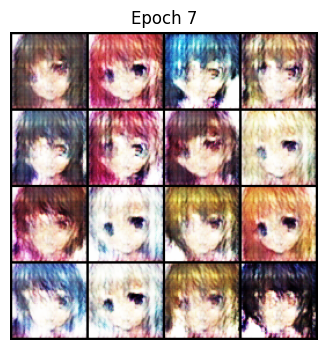

Epoch 07 | G loss: 6.0099 | D loss: 0.5271


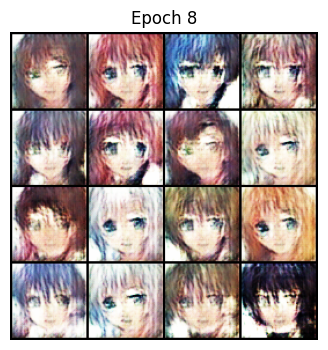

Epoch 08 | G loss: 5.7994 | D loss: 0.4494


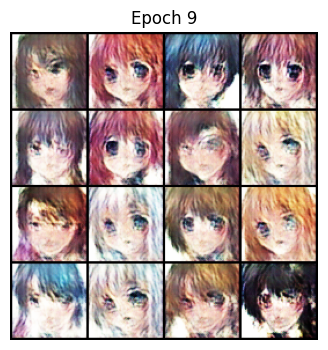

Epoch 09 | G loss: 5.7201 | D loss: 0.4699


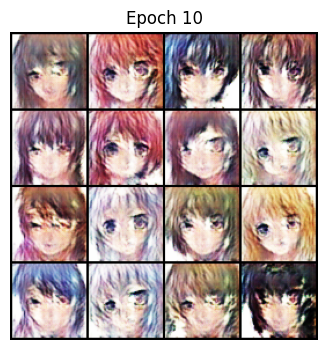

Epoch 10 | G loss: 5.7744 | D loss: 0.5273


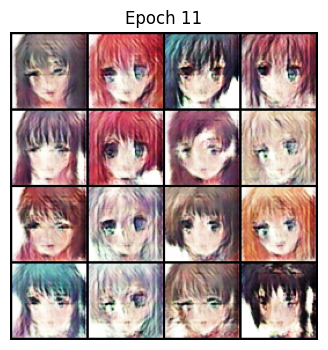

Epoch 11 | G loss: 5.4133 | D loss: 0.5184


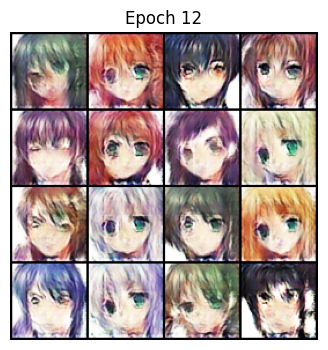

Epoch 12 | G loss: 5.3328 | D loss: 0.4944


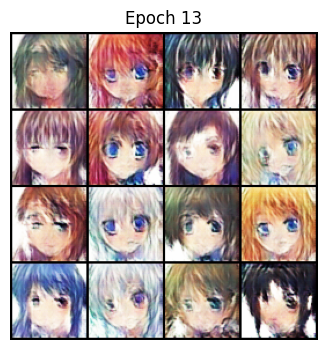

Epoch 13 | G loss: 5.0529 | D loss: 0.4884


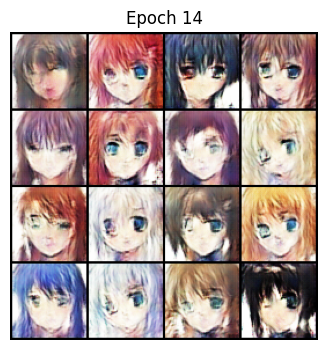

Epoch 14 | G loss: 4.8631 | D loss: 0.5484


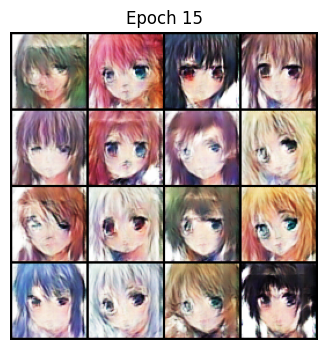

Epoch 15 | G loss: 4.8746 | D loss: 0.4659


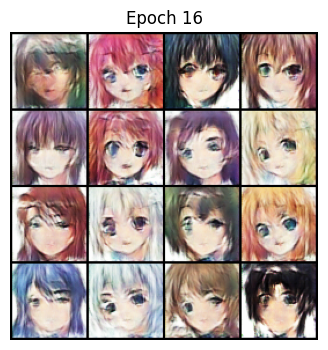

Epoch 16 | G loss: 4.6259 | D loss: 0.5579


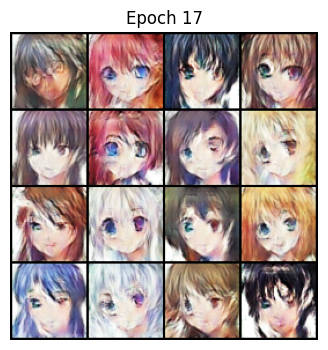

Epoch 17 | G loss: 4.6235 | D loss: 0.5142


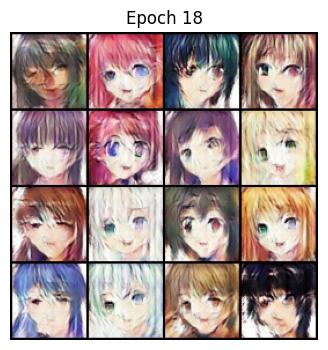

Epoch 18 | G loss: 4.5946 | D loss: 0.5759


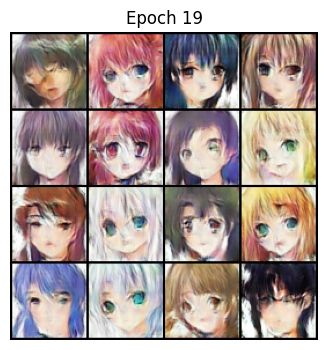

Epoch 19 | G loss: 4.4462 | D loss: 0.4557


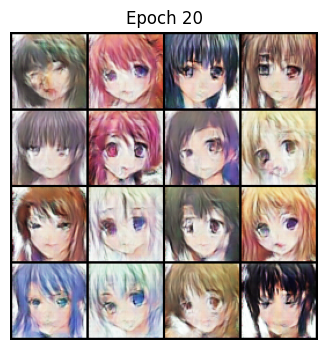

Epoch 20 | G loss: 4.3325 | D loss: 0.5139


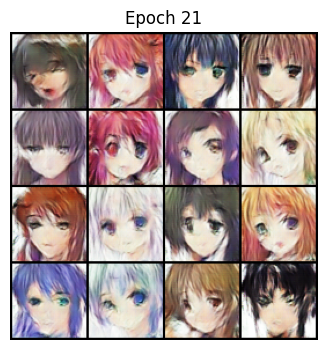

Epoch 21 | G loss: 4.0977 | D loss: 0.5332


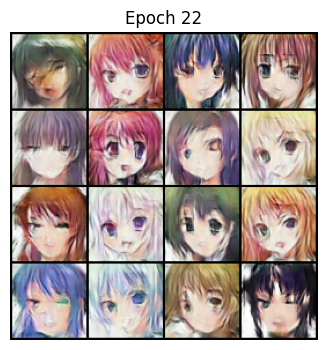

Epoch 22 | G loss: 4.0740 | D loss: 0.4760


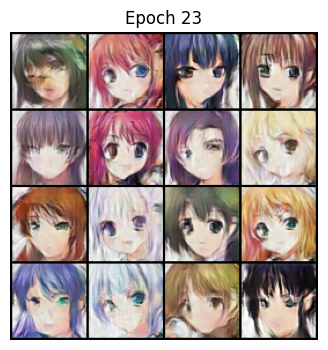

Epoch 23 | G loss: 4.0598 | D loss: 0.5836


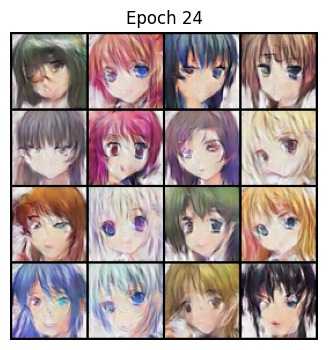

Epoch 24 | G loss: 3.8448 | D loss: 0.5405


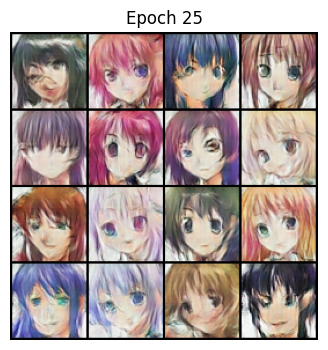

Epoch 25 | G loss: 3.7618 | D loss: 0.5471


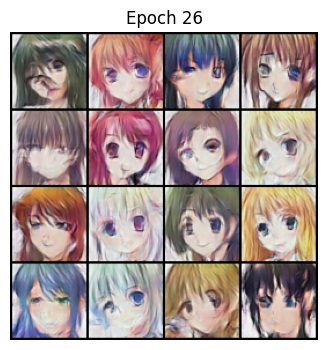

Epoch 26 | G loss: 3.7194 | D loss: 0.5310


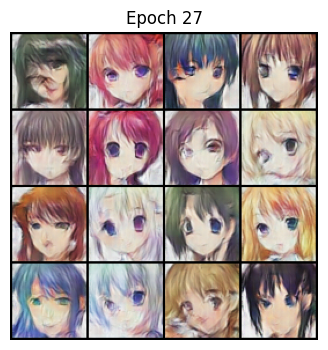

Epoch 27 | G loss: 3.5693 | D loss: 0.5552


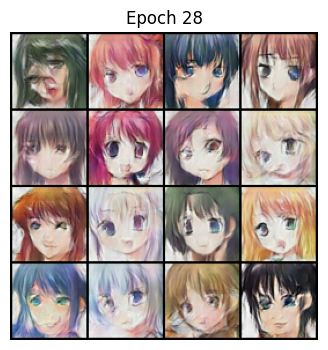

Epoch 28 | G loss: 3.6588 | D loss: 0.5453


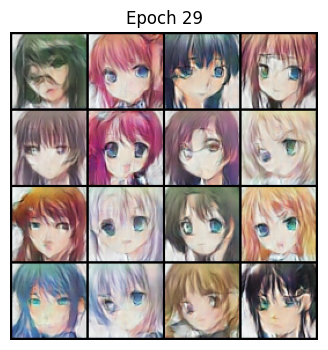

Epoch 29 | G loss: 3.6180 | D loss: 0.5494


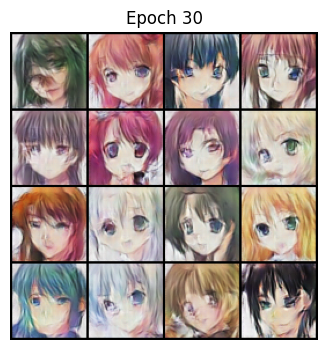

Epoch 30 | G loss: 3.5414 | D loss: 0.5472


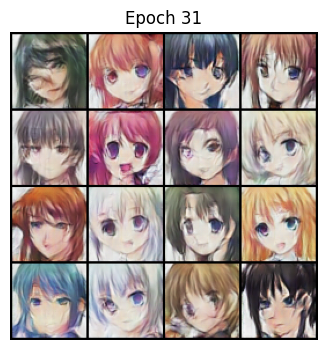

Epoch 31 | G loss: 3.6308 | D loss: 0.5552


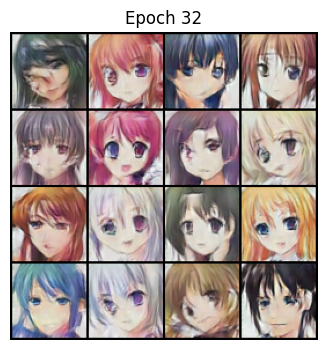

Epoch 32 | G loss: 3.4753 | D loss: 0.5248


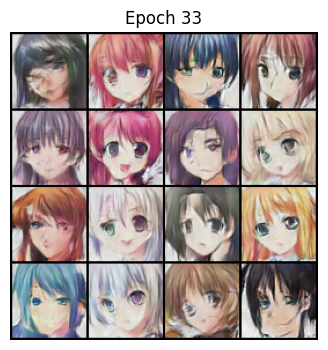

Epoch 33 | G loss: 3.5519 | D loss: 0.4959


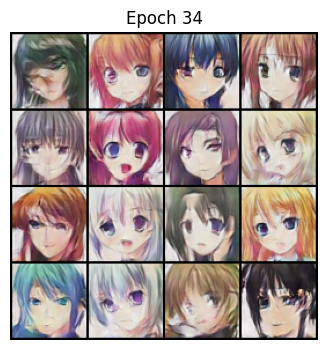

Epoch 34 | G loss: 3.5503 | D loss: 0.5182


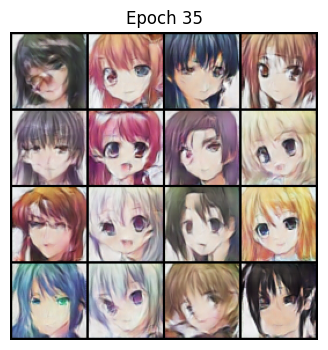

Epoch 35 | G loss: 3.5070 | D loss: 0.4709


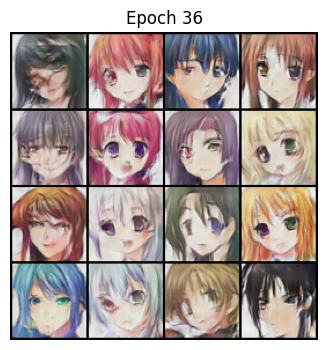

Epoch 36 | G loss: 3.5307 | D loss: 0.5245


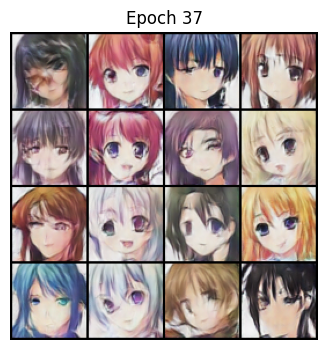

Epoch 37 | G loss: 3.6368 | D loss: 0.4986


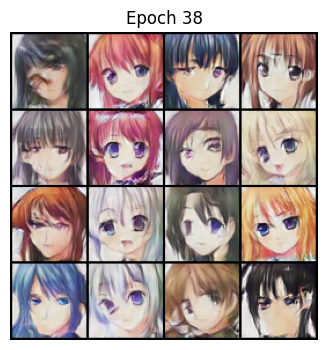

Epoch 38 | G loss: 3.6002 | D loss: 0.5140


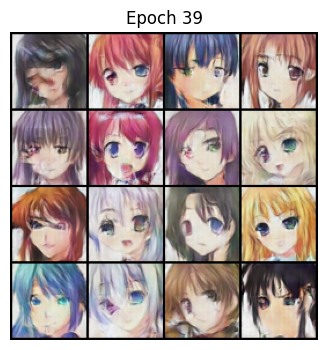

Epoch 39 | G loss: 3.6573 | D loss: 0.5431


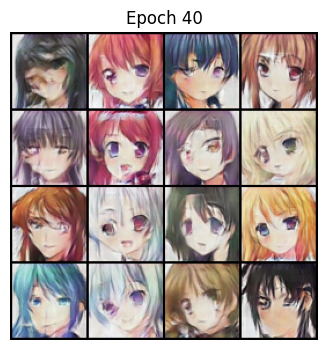

Epoch 40 | G loss: 3.5748 | D loss: 0.4416


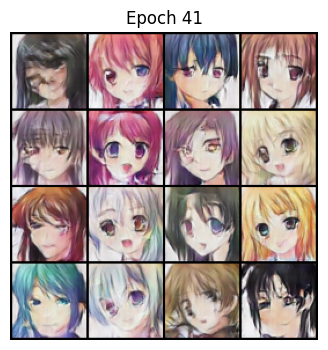

Epoch 41 | G loss: 3.6831 | D loss: 0.4611


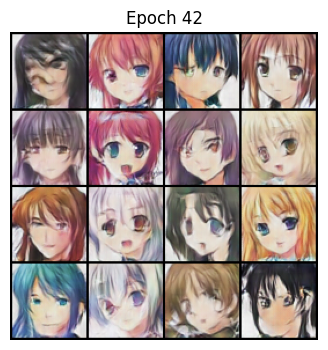

Epoch 42 | G loss: 3.7229 | D loss: 0.4293


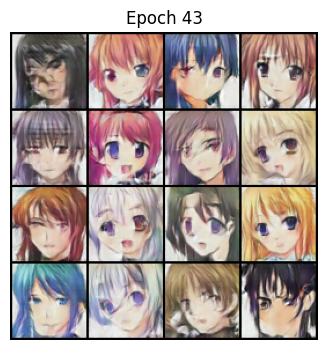

Epoch 43 | G loss: 3.6159 | D loss: 0.5589


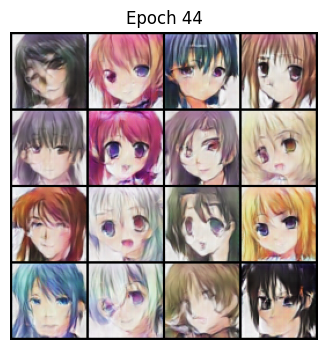

Epoch 44 | G loss: 3.7302 | D loss: 0.3978


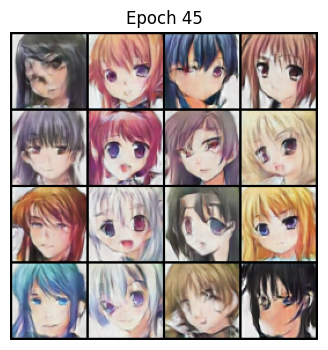

Epoch 45 | G loss: 3.8507 | D loss: 0.4749


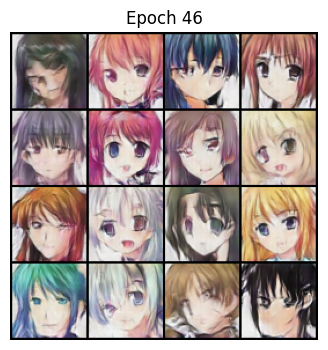

Epoch 46 | G loss: 3.6105 | D loss: 0.4033


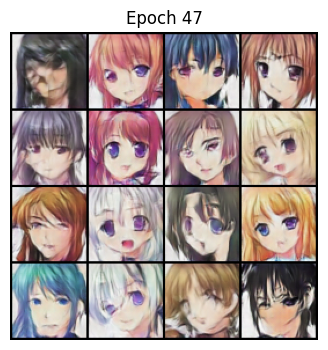

Epoch 47 | G loss: 3.7540 | D loss: 0.5816


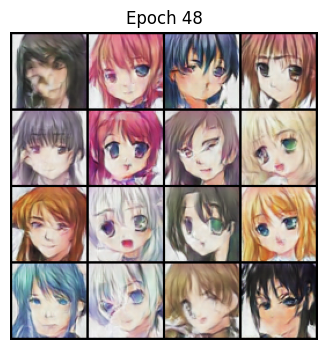

Epoch 48 | G loss: 3.6873 | D loss: 0.3951


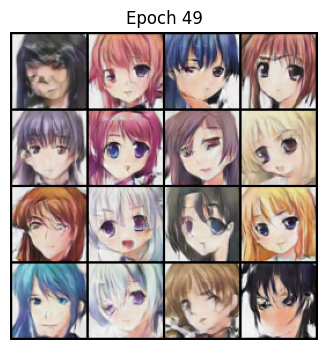

Epoch 49 | G loss: 3.5776 | D loss: 0.5997


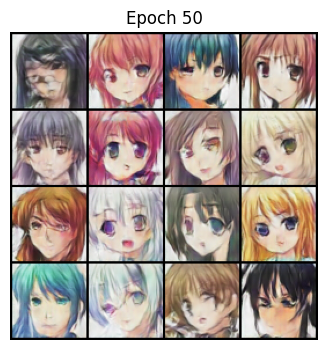

Epoch 50 | G loss: 3.6582 | D loss: 0.4511


In [21]:
num_epochs = 50
epoch_img_dir = './epoch_images_torch'; os.makedirs(epoch_img_dir, exist_ok=True)

for epoch in range(1, num_epochs+1):
    lossG_list, lossD_list = [], []
    for real_imgs in dataloader:
        real_imgs = real_imgs.to(DEVICE)
        g_loss, d_loss = train_step(real_imgs)
        lossG_list.append(g_loss); lossD_list.append(d_loss)

    if epoch % 5 == 0:
        torch.save(netG.state_dict(), f"{ckpt_dir}/netG_epoch{epoch}.pth")
        torch.save(netD.state_dict(), f"{ckpt_dir}/netD_epoch{epoch}.pth")

    with torch.no_grad():
        fake = netG(seed_noise).cpu()
    grid = make_grid((fake+1)/2, nrow=4)
    save_image(grid, os.path.join(epoch_img_dir, f"epoch_{epoch:03d}.png"))

    plt.figure(figsize=(4,4))
    plt.axis('off')
    plt.title(f"Epoch {epoch}")
    plt.imshow(grid.permute(1,2,0))
    plt.show()

    print(f"Epoch {epoch:02d} | G loss: {sum(lossG_list)/len(lossG_list):.4f} | D loss: {sum(lossD_list)/len(lossD_list):.4f}")

## <span style="color: #c77dff">4 | </span><span style="color: #7b2cbf">Results</span>
Display a few saved epoch images

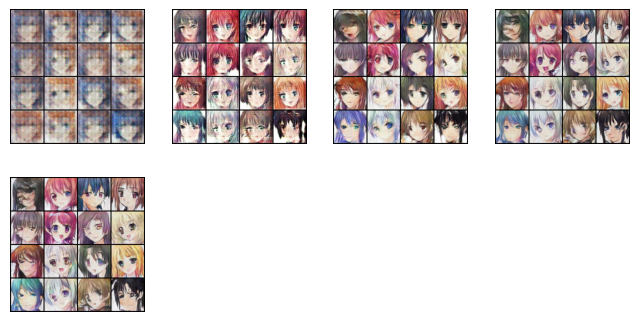

In [22]:
files = sorted(glob.glob(os.path.join(epoch_img_dir, '*.png')))
plt.figure(figsize=(8,4))
for i, fn in enumerate(files[::10][:8]):
    img = Image.open(fn)
    plt.subplot(2,4,i+1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

## <span style="color: #c77dff">5 | </span><span style="color: #7b2cbf">Fresh Image Generation</span>

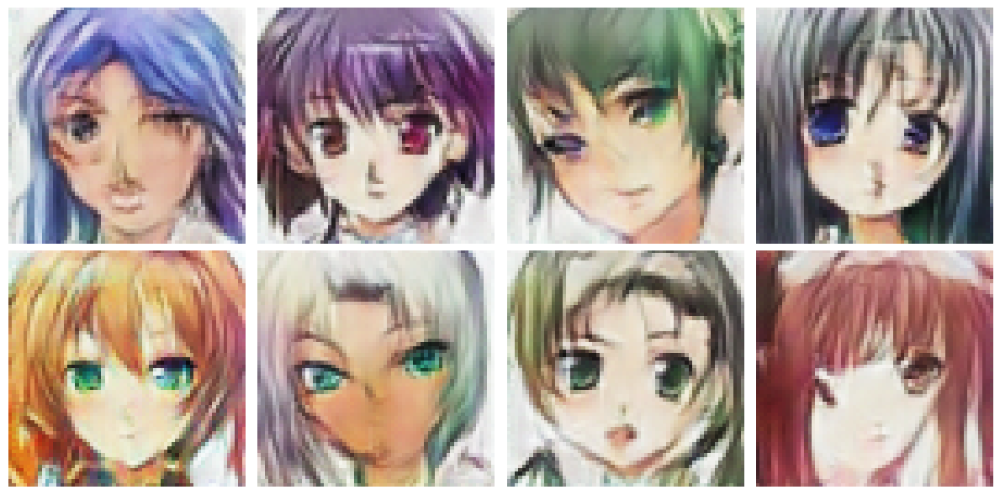

In [23]:
out_dir = './generated_samples_torch'; os.makedirs(out_dir, exist_ok=True)
noise   = torch.randn(8,100,1,1, device=DEVICE)
with torch.no_grad():
    fake = (netG(noise).cpu() + 1)/2
plt.figure(figsize=(12,6))
for i in range(8):
    plt.subplot(2,4,i+1)
    plt.imshow(fake[i].permute(1,2,0))
    plt.axis('off')
    save_image(fake[i], os.path.join(out_dir, f"sample_{i+1}.png"))
plt.tight_layout()
plt.show()

## <span style="color: #c77dff">5 | </span><span style="color: #7b2cbf">Saving the Model</span>

There are two types to save the model: **`1. TorchScript`** | **`2. state_dict`**
1. **TorchScript usecase:** Deploying to production servers, mobile apps, or anywhere you want a standalone model artifact with minimal Python overhead.
2. **state_dict usecase:** Continuing training, fine-tuning, or any scenario where you already have the model code available.

In [24]:
# TorchScript
ts_model = torch.jit.script(netG.cpu())
ts_model.save("anime_dcgan_generator_torchscript.pt")

# state_dict
torch.save(netG.state_dict(), "anime_dcgan_generator.pth")
print("✅ Models saved: TorchScript & state_dict.")

✅ Models saved: TorchScript & state_dict.


---

<p align="center">
    <strong style="font-size: 25px;">The End!</strong>
</p>

<br>

<p align="center">
    <span style="font-size: 16.5px; font-weight: normal;">Mohammad Soroush Esnaashari</span>
</p>

<p align="center">
  <a href="https://soroushesnaashari.github.io" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="Website"
         src="https://img.shields.io/badge/-Website-2d2d2d?style=flat-square&logo=githubpages&logoColor=white"
         style="vertical-align:middle;">
  </a>
  <a href="https://www.linkedin.com/in/soroushesnaashari" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="LinkedIn"
         src="https://custom-icon-badges.demolab.com/badge/-LinkedIn-2d2d2d?style=flat-square&logo=linkedin-white&logoColor=white"
         style="vertical-align:middle;">
  </a>
  <a href="https://x.com/srshesn" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="X"
         src="https://img.shields.io/badge/-Twitter-2d2d2d?style=flat-square&logo=X&logoColor=white"
         style="vertical-align:middle;">
  </a>
  <a href="https://github.com/soroushesnaashari" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="GitHub"
         src="https://img.shields.io/badge/-GitHub-2d2d2d?style=flat-square&logo=github&logoColor=white"
         style="vertical-align:middle;">
  </a>
  <a href="https://www.kaggle.com/soroushesnaashari" target="_blank" style="display:inline-block; margin:0 4px;">
    <img alt="Kaggle"
         src="https://img.shields.io/badge/-Kaggle-2d2d2d?style=flat-square&logo=kaggle&logoColor=white"
         style="vertical-align:middle;">
  </a>
</p>